In [1]:
from PIL import Image
import os
import numpy as np
from matplotlib import pyplot as plt
import yaml
import pickle
import pandas as pd

In [2]:
# load ds dcore
with open(f"metric_ds.pickle", 'rb') as handle:
    ds_score = pickle.load(handle)

In [3]:
for _, dir, files in os.walk('.'):
    break

In [4]:
dir = [d for d in dir if 'output_' in d]
conf_file = [d for d in files if 'yaml' in d and 'gen' not in d][0]

In [5]:
with open(conf_file, "r") as f:
    config = yaml.safe_load(f)

In [6]:
dir_files = {}
name_files = set()
for d in dir:
    dir_files[d] = {}
    dir_files[d]['files'] = []
    for _, cd, fl in os.walk(f'./{d}'):
        break
    conf_file = [d for d in fl if 'log' in d ][0]
    with open(f"./{d}/{conf_file}", "r") as f:
        config = yaml.safe_load(f)
    dir_files[d]['config'] = config
    if 'inference' in cd:
        for _, _, files in os.walk(f'./{d}/inference'):
            break
        dir_files[d]['files'] += files
        name_files = name_files.union(set(files))

In [7]:
!ls

base			output_2504192355  reconciliation.ipynb  xt_list.pkl
config_2504192159.yaml	output_2504200054  target.jpg
metric_ds.pickle	reconciliation	   target_mask.png


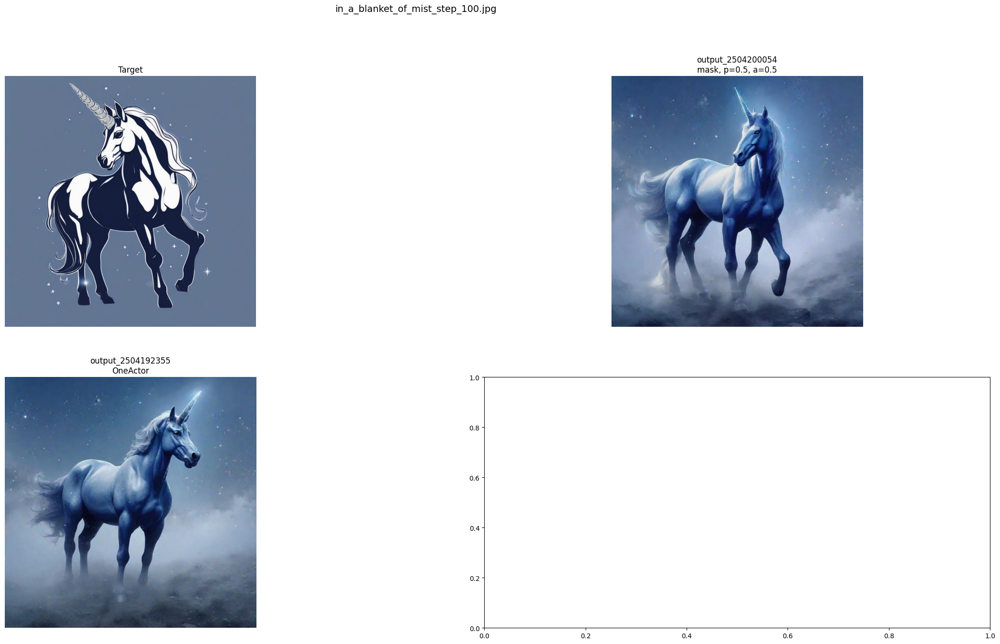

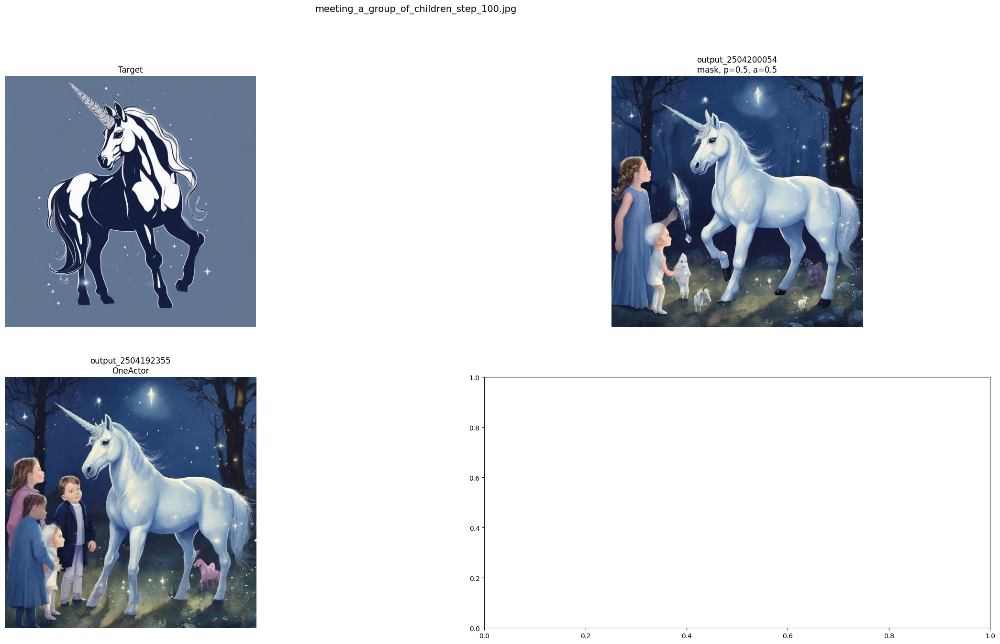

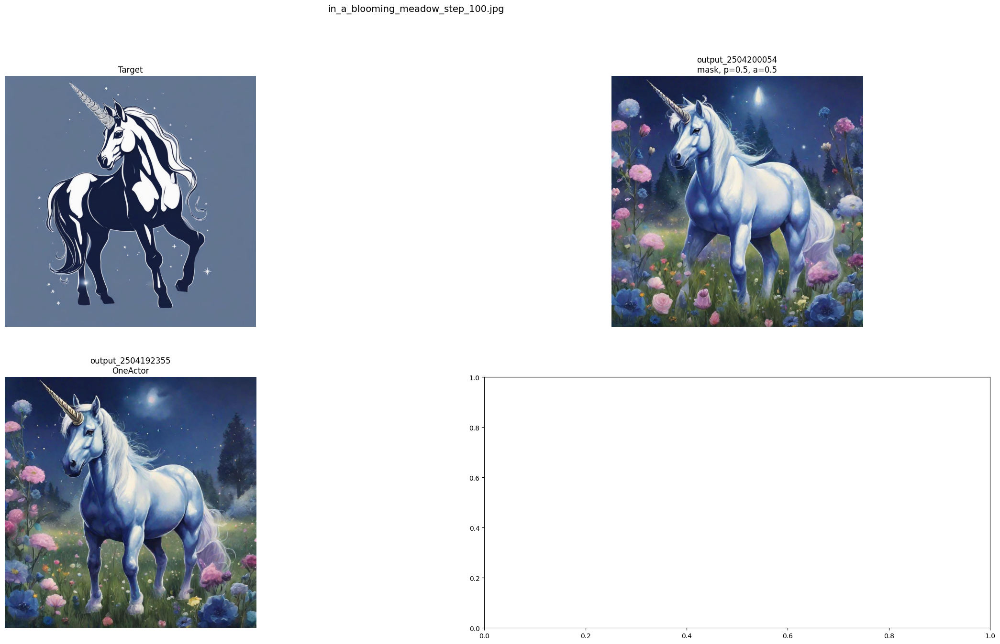

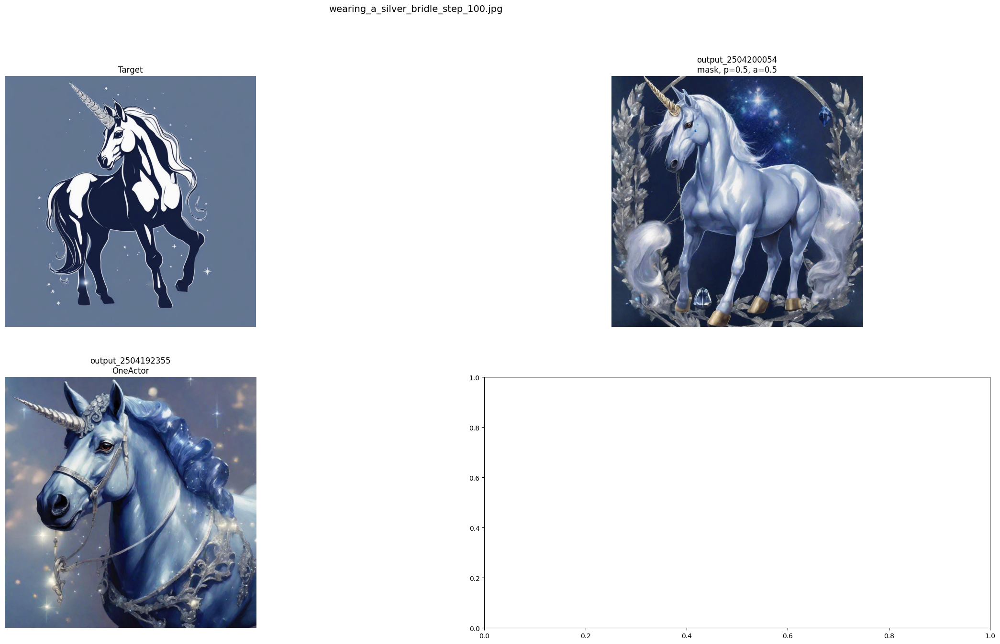

In [8]:
import os
os.makedirs(f"./reconciliation", exist_ok=True)

# 100, 80, 40, 20
for n, file_name in enumerate(name_files):
    if '100' not in file_name:
        continue
    f, axarr = plt.subplots(2, (len(dir) + 2) // 2, figsize=(30, 15))
    axarr[0][0].imshow(Image.open('target.jpg'))
    axarr[0][0].set_title("Target")
    axarr[0][0].axis('off')
    for m, d in enumerate(dir):
        
        if file_name in dir_files[d]['files']:
            axarr[(m+1) // ((len(dir) + 2) // 2)][(m+1) % ((len(dir) + 2) // 2)].imshow(Image.open(f'./{d}/inference/{file_name}'))
            if dir_files[d]['config']['use_mask']:
                title = f"mask, p={dir_files[d]['config']['mask_power']}, a={dir_files[d]['config']['mask_alpha']}"
            elif dir_files[d]['config']['use_zone']:
                title = f"zone, a={dir_files[d]['config']['zone_alpha']}"
            else:
                title="OneActor"
            title = f"{d}\n{title}"
            axarr[(m+1) // ((len(dir) + 2) // 2)][(m+1) % ((len(dir) + 2) // 2)].set_title(title)
            axarr[(m+1) // ((len(dir) + 2) // 2)][(m+1) % ((len(dir) + 2) // 2)].axis('off')
    f.suptitle(f'{file_name}', fontsize=14)
    plt.show()
    f.savefig(f'./reconciliation/rec_{file_name}')       

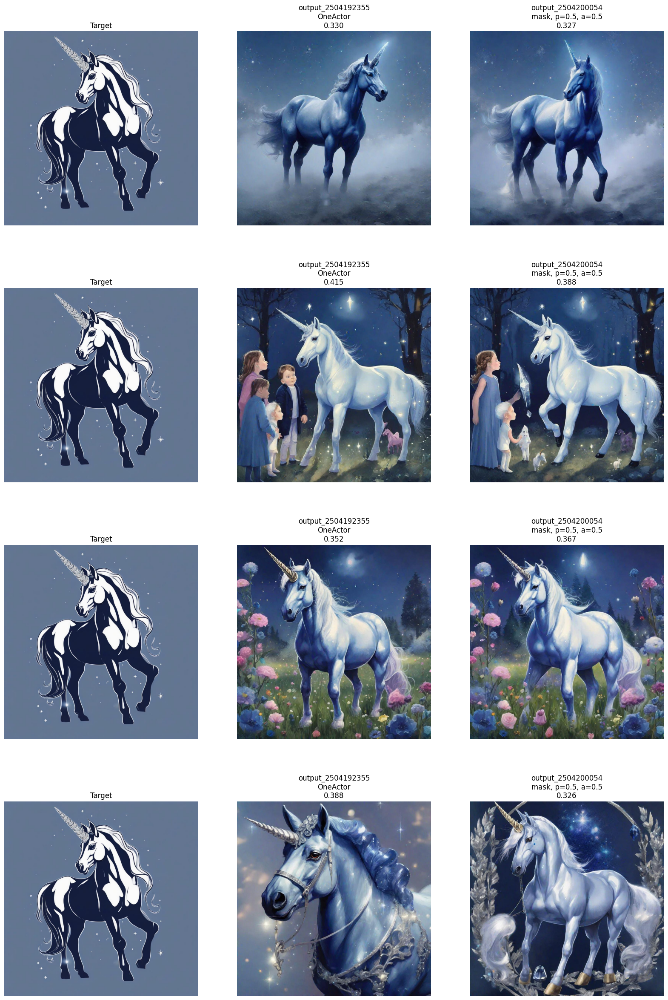

In [9]:
import os
os.makedirs(f"./reconciliation", exist_ok=True)

EPOCH = 100

dir_short = ['output_2504192355', 'output_2504200054']
# 100, 80, 40, 20
name_files_short = [f for f in name_files if str(EPOCH) in f]
f, axarr = plt.subplots(len(name_files_short), (len(dir_short) + 1), figsize=(20, 30))

for n, file_name in enumerate(name_files_short):
    axarr[n][0].imshow(Image.open('target.jpg'))
    axarr[n][0].set_title("Target")
    axarr[n][0].axis('off')
    for m, d in enumerate(dir_short):
        axarr[n][m+1].imshow(Image.open(f'./{d}/inference/{file_name}'))
        if dir_files[d]['config']['use_mask']:
            title = f"mask, p={dir_files[d]['config']['mask_power']}, a={dir_files[d]['config']['mask_alpha']}"
        elif dir_files[d]['config']['use_zone']:
            title = f"zone, a={dir_files[d]['config']['zone_alpha']}"
        else:
            title="OneActor"
        prompt = ('_'.join(file_name.split(".")[0].split("_")[:-1]))
        score = ds_score[(ds_score['prompt'] == prompt) & (ds_score['epoch'] == EPOCH) & (ds_score['model'] == d)]['distance'].values[0]
        title = f"{d}\n{title}\n{score:0.3f}"
        axarr[n][m+1].set_title(title)
        axarr[n][m+1].axis('off')
plt.show()
f.savefig(f'./reconciliation/rec_OA_vs_Mask')         